# Randomize-Then-Optimize

See this to get also MH rejection https://github.com/MercuryBench/randomize-then-optimize

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

from matplotlib.ticker import FuncFormatter, MultipleLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import gaussian_filter
from scipy.signal import filtfilt
from scipy.linalg import toeplitz, cholesky
from scipy.ndimage import gaussian_filter
from pylops.basicoperators import *
from pylops.avo import PoststackLinearModelling
from pylops.utils.wavelets import ricker
from pylops.utils.dottest import dottest
from pylops.utils.signalprocessing import dip_estimate
from pylops.optimization.leastsquares import normal_equations_inversion

## Toy example

We start with a toy example of the form:

$$
\mathbf{d} = \mathbf{Gm} + \mathbf{n} \sim \mathcal{N}(\mathbf{Gm}, \mathbf{C}_d) \rightarrow p(\mathbf{d}|\mathbf{m}) \; \alpha \; e^{-\frac{1}{2}||\mathbf{d}-\mathbf{Gm}||_{\mathbf{C}_d^{-1}}}
$$

and

$$
\mathbf{m} = \mathbf{m}_0 + \mathbf{z} \sim \mathcal{N}(\mathbf{m}_0, \mathbf{C}_m) \rightarrow p(\mathbf{m}) \; \alpha \; e^{-\frac{1}{2}||\mathbf{m}-\mathbf{m_0}||_{\mathbf{C}_m^{-1}}}
$$

The negative log-posterior becomes:

$$
J = - log p(\mathbf{d}|\mathbf{m}) - logp(\mathbf{m}) = \frac{1}{2} ||\mathbf{d}-\mathbf{Gm}||_{\mathbf{C}_d^{-1}} + \frac{1}{2} ||\mathbf{m}-\mathbf{m}_0||_{\mathbf{C}_m^{-1}} 
$$

which is equivalent to the system:

$$
\begin{bmatrix}
\mathbf{\mathbf{C}_d^{-1/2} \mathbf{G}} \\
\mathbf{\mathbf{C}_m^{-1/2}}
\end{bmatrix} \mathbf{m} = 
\begin{bmatrix}
\mathbf{\mathbf{C}_d^{-1/2}\mathbf{d}} \\
\mathbf{\mathbf{C}_m^{-1/2}\mathbf{m}_0}
\end{bmatrix}
$$

whose analytical solution (the mean and covariance of the posterior distribution) are:

$$
\mathbf{m}_{post} = (\mathbf{G}^T \mathbf{C}_d^{-1} \mathbf{G} + \mathbf{C}_m^{-1})^{-1} (\mathbf{G}^T\mathbf{C}_d^{-1} \mathbf{d} + \mathbf{C}_m^{-1} \mathbf{m_0})
$$

and

$$
\mathbf{C}_{m,post} = (\mathbf{G}^T \mathbf{C}_d^{-1} \mathbf{G} + \mathbf{C}_m^{-1})^{-1} 
$$


We can also write the analytical solution for the posterior mean in a different form alongside that of the covariance matrix:

$$
\mathbf{m}_{post} = \mathbf{m_0} + \mathbf{C}_m\mathbf{G}^T(\mathbf{G} \mathbf{C}_m \mathbf{G}^T + \mathbf{C}_d)^{-1} (\mathbf{d} - \mathbf{G} \mathbf{m_0})
$$

and

$$
\mathbf{C}_{m,post} = \mathbf{C}_{m} - \mathbf{C}_m\mathbf{G}^T(\mathbf{G} \mathbf{C}_m \mathbf{G}^T + \mathbf{C}_d)^{-1} \mathbf{G} \mathbf{C}_{m}
$$



In [2]:
np.random.seed(10)

# Problem size
nm, nd = 3, 3

# Prior m
m0 = 1 + 0.3 * np.random.random(nm)
Cm0 = 0.5 * np.diag(np.random.random(nm).astype(np.float64))

# Data
G = 4 * np.random.randint(-5, 5, (nm, nd)).astype(np.float64)
Cd = 1 * np.diag(np.random.random(nd).astype(np.float64))
Cd_12 = np.linalg.cholesky(Cd)

# Actual solution 
m = np.ones(nm)
d = G @ m + Cd_12 @ np.random.normal(0, 1, nd)

### Analytical solution

In [3]:
# Deterministic solution (check I can retrieve the true one)
mdet = np.linalg.solve(G, d)
mdet

array([1.07112729, 1.15642386, 0.97449466])

In [4]:
# Bayesian analytical solution
mpost = m0 + Cm0 @ G.T @ (np.linalg.solve(G @ Cm0 @ G.T + Cd, d - G @ m0))
#mpost = np.linalg.solve(G.T @ np.linalg.inv(Cd) @ G + np.linalg.inv(Cm0), G.T @ np.linalg.inv(Cd) @ d - np.linalg.inv(Cm0) @ m0)
Cmpost = Cm0 - Cm0 @ G.T @ (np.linalg.solve(G @ Cm0 @ G.T + Cd, G @ Cm0))
#Cmpost = np.linalg.pinv(G.T @ np.linalg.inv(Cd) @ G + np.linalg.inv(Cm0))

mpost, Cmpost

(array([1.03956383, 1.0872974 , 1.00610081]),
 array([[ 0.01380185,  0.02745579, -0.0109098 ],
        [ 0.02745579,  0.05793833, -0.02396347],
        [-0.0109098 , -0.02396347,  0.01138376]]))

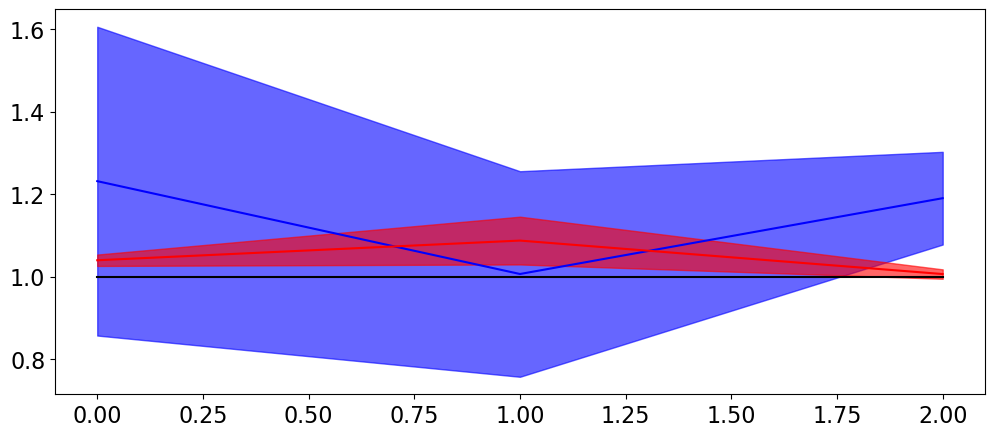

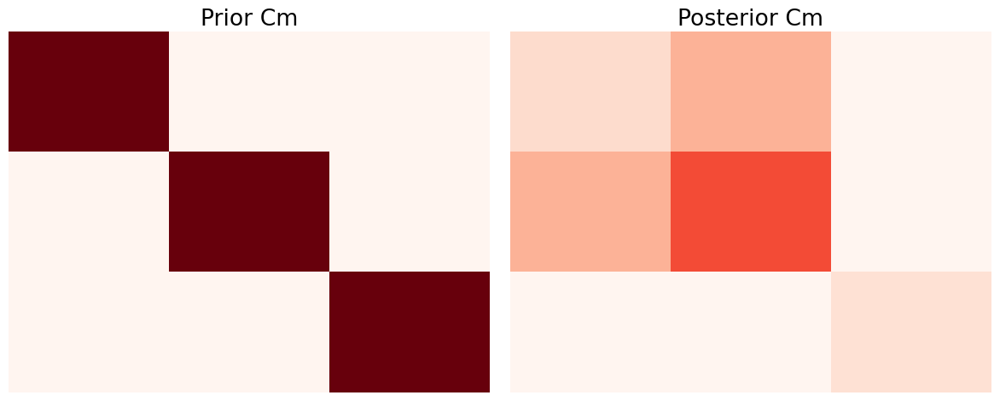

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(m0, 'b')
ax.fill_between(np.arange(nm), m0-np.diag(Cm0), m0+np.diag(Cm0), color='b', alpha=0.6)
ax.plot(mpost, 'r')
ax.fill_between(np.arange(nm), mpost-np.diag(Cmpost), mpost+np.diag(Cmpost), color='r', alpha=0.6)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(Cm0, cmap='Reds', vmin=0, vmax=.1)
axs[0].set_title('Prior Cm')
axs[0].axis('tight')
axs[0].axis('off')

axs[1].imshow(Cmpost, cmap='Reds', vmin=0, vmax=.1)
axs[1].set_title('Posterior Cm')
axs[1].axis('tight')
axs[1].axis('off')

fig.tight_layout()

### RTO

In [6]:
np.random.seed(10)

# RTO solution
nreals = 10_000

mpostreals = []
for ireal in range(nreals):
    dreal = d + np.random.normal(0, 1, nd)
    
    mreal =  m0 + Cm0 @ G.T @ (np.linalg.solve(G @ Cm0 @ G.T + Cd, dreal - G @ m0))
    #mreal = np.linalg.solve(G.T @ np.linalg.inv(Cd) @ G + np.linalg.inv(Cm0), G.T @ np.linalg.inv(Cd) @ dreal - np.linalg.inv(Cm0) @ m0)
    mpostreals.append(mreal)
    
mpostreals = np.vstack(mpostreals)
print(mpostreals.shape)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
Cmpostrto = ((mpostreals - mpostrto).T @ (mpostreals - mpostrto)) / (nreals - 1)

mpostrto, Cmpostrto

(10000, 3)


(array([1.03854111, 1.08421566, 1.00753879]),
 array([[ 0.01129455,  0.02352715, -0.00944587],
        [ 0.02352715,  0.0577167 , -0.02476428],
        [-0.00944587, -0.02476428,  0.01232666]]))

array([[-18.16636801, -14.30896008, -13.41848517],
       [-14.30896008,  -0.38251818,   3.3417892 ],
       [-13.41848517,   3.3417892 ,   8.28286024]])

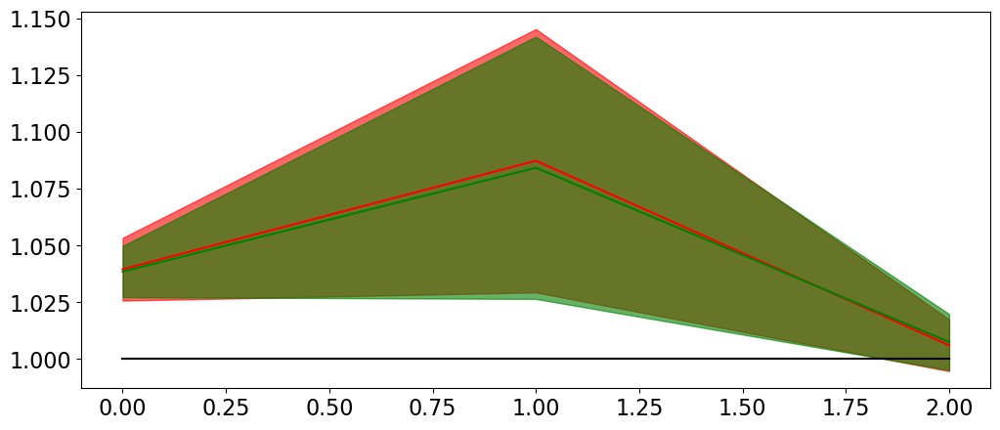

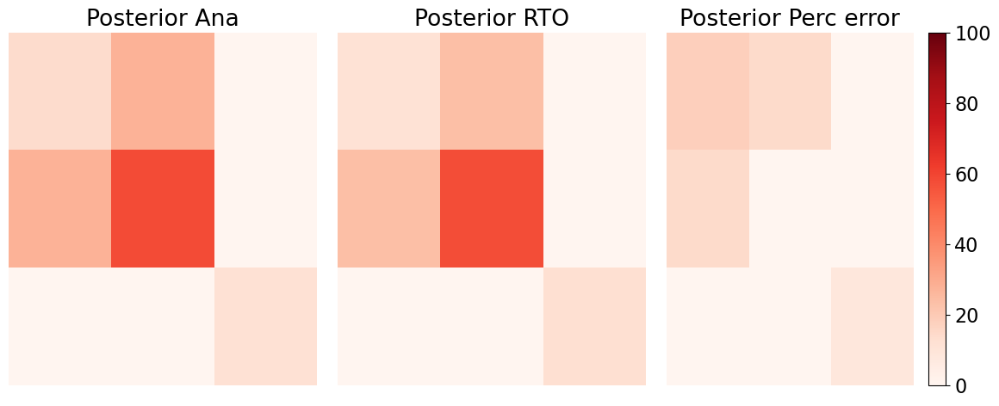

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(mpost, 'r')
ax.fill_between(np.arange(nm), mpost-np.diag(Cmpost), mpost+np.diag(Cmpost), color='r', alpha=0.6)
ax.plot(mpostrto, 'g')
ax.fill_between(np.arange(nm), mpostrto-np.diag(Cmpostrto), mpostrto+np.diag(Cmpostrto), color='g', alpha=0.6)

fig, axs = plt.subplots(1, 3, figsize=(12, 5))
axs[0].imshow(Cmpost, cmap='Reds', vmin=0, vmax=.1)
axs[0].set_title('Posterior Ana')
axs[0].axis('tight')
axs[0].axis('off')

axs[1].imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=.1)
axs[1].set_title('Posterior RTO')
axs[1].axis('tight')
axs[1].axis('off')

im = axs[2].imshow(100 * np.abs(Cmpostrto-Cmpost) / Cmpost, cmap='Reds', vmin=0, vmax=100)
axs[2].set_title('Posterior Perc error')
axs[2].axis('tight')
axs[2].axis('off')
plt.colorbar(im, ax=axs[2])

fig.tight_layout()

100 * (Cmpostrto-Cmpost) / Cmpost

## Toy example with generic C_d

Before we assumed $\mathbf{C}_d=\mathbf{I}$, now we take any $\mathbf{C}_d$ and apply a transformation to the problem

In [8]:
np.random.seed(10)

# Problem size
nm, nd = 3, 3

# Prior m
m0 = 1 + 0.3 * np.random.random(nm)
Cm0 = 0.5 * np.diag(np.random.random(nm).astype(np.float64))

# Data
G = (4 * np.sqrt(3)) * np.random.randint(-5, 5, (nm, nd)).astype(np.float64)
Cd = 3 * np.diag(np.random.random(nd).astype(np.float64))
Cd_12 = np.linalg.cholesky(Cd)

# Actual solution 
m = np.ones(nm)
d = G @ m + Cd_12 @ np.random.normal(0, 1, nd)

In [9]:
# Rescale problem
Cd_min1 = np.linalg.inv(Cd)
Cd_min12 = np.linalg.cholesky(Cd_min1)

Gscaled = Cd_min12 @ G
dscaled = Cd_min12 @ d
Cdscaled = np.eye(nd)

### Analytical solution

In [10]:
# Deterministic solution (check I can retrieve the true one)
mdet = np.linalg.solve(Gscaled, dscaled)
mdet

array([1.07112729, 1.15642386, 0.97449466])

In [11]:
# Bayesian analytical solution
mpostscaled = m0 + Cm0 @ Gscaled.T @ (np.linalg.solve(Gscaled @ Cm0 @ Gscaled.T + Cdscaled, dscaled - Gscaled @ m0))
Cmpostscaled = Cm0 - Cm0 @ Gscaled.T @ (np.linalg.solve(Gscaled @ Cm0 @ Gscaled.T + Cdscaled, Gscaled @ Cm0))

mpost-mpostscaled, Cmpost-Cmpostscaled

(array([ 6.66133815e-16,  6.66133815e-16, -4.44089210e-16]),
 array([[-1.11022302e-16, -2.77555756e-16,  1.50920942e-16],
        [-2.77555756e-17, -3.60822483e-16,  3.05311332e-16],
        [ 1.11022302e-16,  2.22044605e-16, -1.52655666e-16]]))

### RTO

In [12]:
np.random.seed(10)

# RTO solution
nreals = 10_000

mpostreals = []
for ireal in range(nreals):
    dreal = dscaled + np.random.normal(0, 1, nd)
    
    mreal =  m0 + Cm0 @ Gscaled.T @ (np.linalg.solve(Gscaled @ Cm0 @ Gscaled.T + Cdscaled, dreal - Gscaled @ m0))
    mpostreals.append(mreal)
    
mpostreals = np.vstack(mpostreals)
print(mpostreals.shape)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
Cmpostrto = ((mpostreals - mpostrto).T @ (mpostreals - mpostrto)) / nreals

mpostrto, Cmpostrto

(10000, 3)


(array([1.03874961, 1.08509698, 1.00711963]),
 array([[ 0.00909744,  0.01757145, -0.00674482],
        [ 0.01757145,  0.03711338, -0.01515978],
        [-0.00674482, -0.01515978,  0.00764317]]))

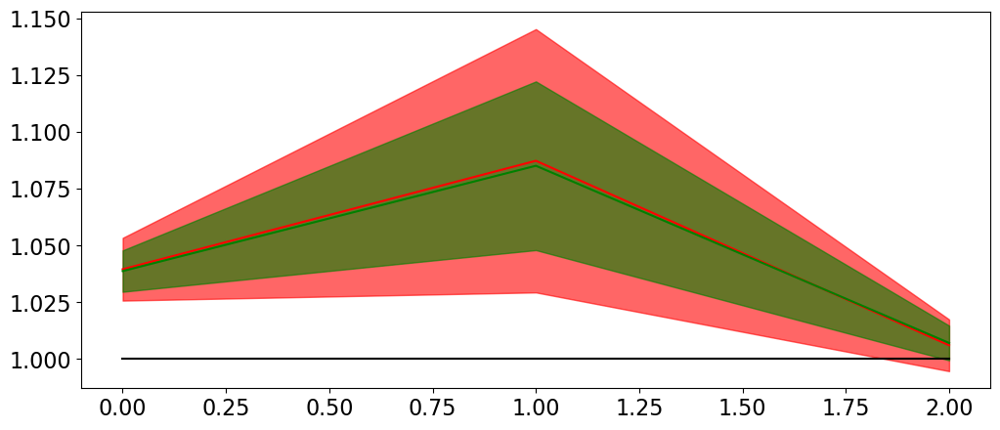

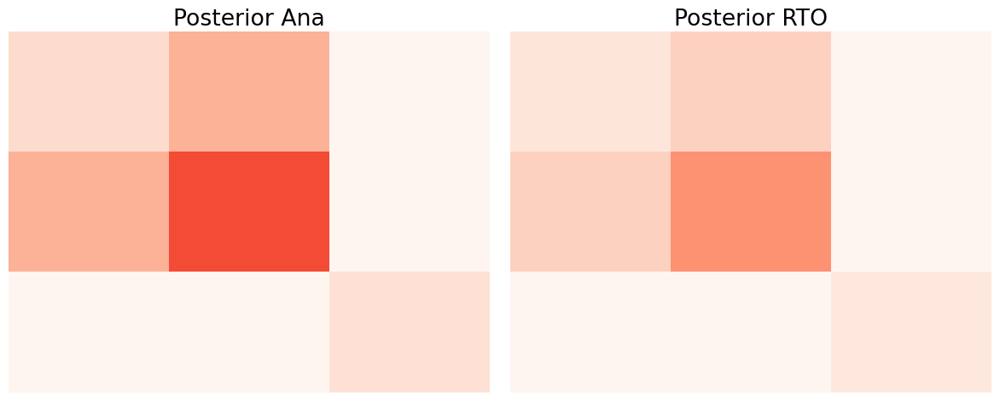

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(mpostscaled, 'r')
ax.fill_between(np.arange(nm), mpostscaled-np.diag(Cmpostscaled), mpostscaled+np.diag(Cmpostscaled), color='r', alpha=0.6)
ax.plot(mpostrto, 'g')
ax.fill_between(np.arange(nm), mpostrto-np.diag(Cmpostrto), mpostrto+np.diag(Cmpostrto), color='g', alpha=0.6)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(Cmpostscaled, cmap='Reds', vmin=0, vmax=.1)
axs[0].set_title('Posterior Ana')
axs[0].axis('tight')
axs[0].axis('off')

axs[1].imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=.1)
axs[1].set_title('Posterior RTO')
axs[1].axis('tight')
axs[1].axis('off')

fig.tight_layout()

## 1D Seismic Inversion

In [14]:
np.random.seed(0)

# Model and background
nt0 = 301
dt0 = 0.004
nsmooth = 100

t0  = np.arange(nt0)*dt0
vp  = 1200 + np.arange(nt0) + filtfilt(np.ones(5)/5.,1,np.random.normal(0, 80, nt0))
rho = 1000 + vp             + filtfilt(np.ones(5)/5.,1,np.random.normal(0, 30, nt0))
vp[131:]+=500
rho[131:]+=100

# Model and background  model
ai = np.log(vp*rho).flatten()
aiback = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, ai)

# Wavelet
ntwav = 41

t0  = np.arange(nt0)*dt0
wav = 1e3 * ricker(t0[:ntwav//2+1], 15)[0]

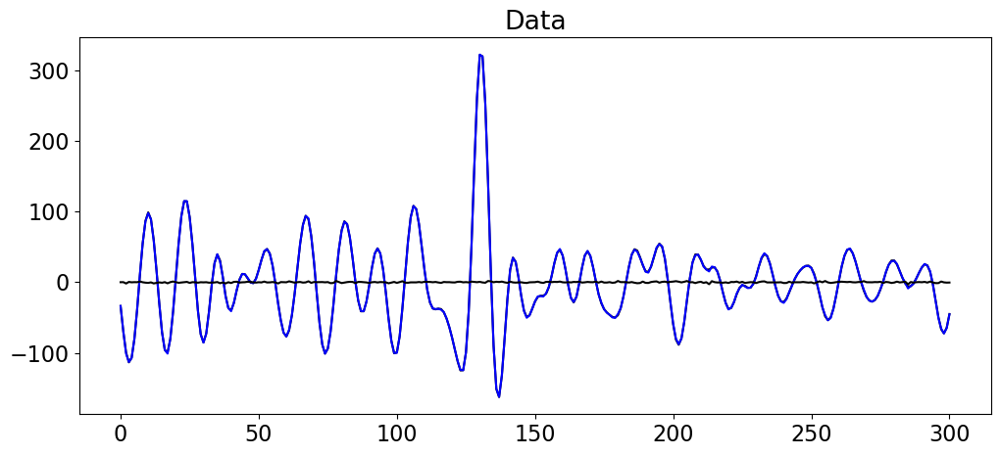

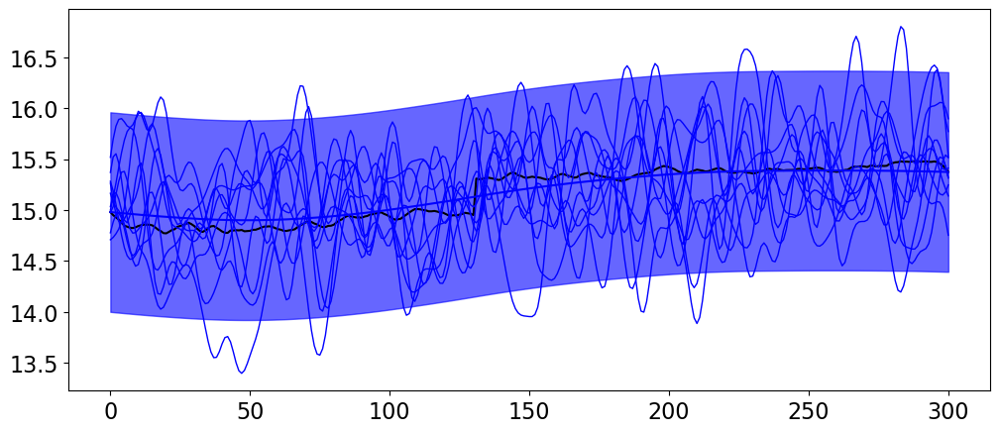

In [15]:
# Prior m
corrrange = .04
sigma_m = .5

corr = np.exp(-3*(t0)**2/corrrange**2)
Corr = toeplitz(corr)
Std = np.diag(sigma_m * np.ones(Corr.shape[0]))
Cm0 = np.dot(Std, np.dot(Corr, Std))
Cm0_12 = cholesky(Cm0 + 1e-10*np.eye(nt0), lower=True)

# Model
#ai = Cm0_12 @ np.random.normal(0, 1, nt0)
#aiback = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, ai)

# Operator and data noise
G = PoststackLinearModelling(wav, nt0=nt0, explicit=True)
G = G.A
Cd = 1 * np.diag(np.random.random(nt0).astype(np.float64))
Cd_12 = np.linalg.cholesky(Cd)

# Data 
m0 = aiback
m = ai
dtrue = G @ m 
d = dtrue + Cd_12 @ np.random.normal(0, 1, nt0)

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(dtrue, 'k')
ax.plot(d, 'b')
ax.plot(d-dtrue, 'k')
ax.set_title('Data');

# Prior realizations
mpriorreals = m0[:, None] + Cm0_12 @ np.random.normal(0, 1, (nt0, 10))

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(m0, 'b')
ax.fill_between(np.arange(nt0), m0 - 1.96 *np.sqrt(np.diag(Cm0)), 
                m0 + 1.96 *np.sqrt(np.diag(Cm0)), color='b', alpha=0.6)
ax.plot(mpriorreals, 'b', lw=1);

### Analytical solution

In [16]:
# Bayesian analytical solution
mpost = m0 + Cm0 @ G.T @ (np.linalg.pinv(G @ Cm0 @ G.T + Cd, rcond=1e-6) @ (d - G @ m0))
#mpost = np.linalg.pinv(G.T @ np.linalg.inv(Cd) @ G + np.linalg.inv(Cm0), rcond=1e-10) @ (G.T @ np.linalg.inv(Cd) @ d - np.linalg.inv(Cm0) @ m0)
Cmpost = Cm0 - Cm0 @ G.T @ (np.linalg.pinv(G @ Cm0 @ G.T + Cd, rcond=1e-6) @ (G @ Cm0))

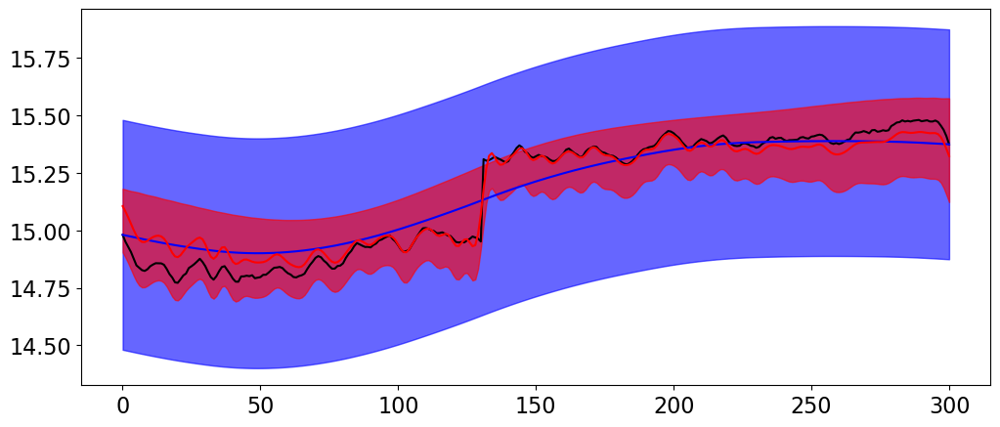

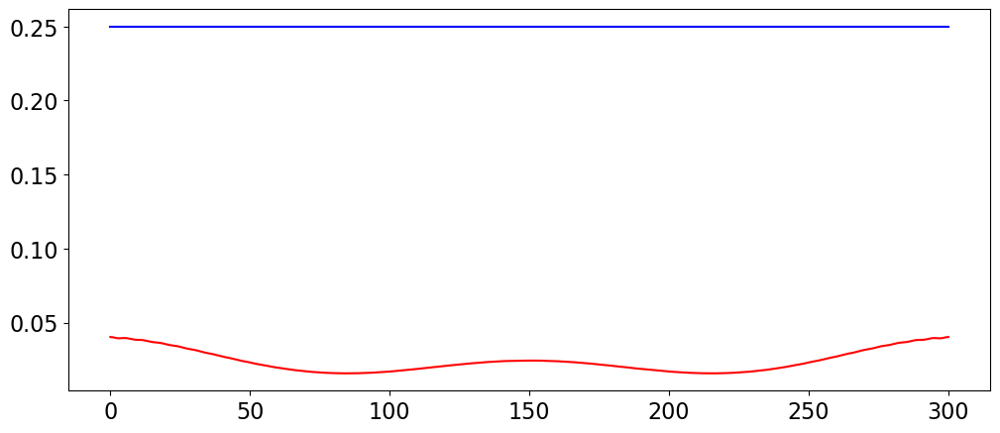

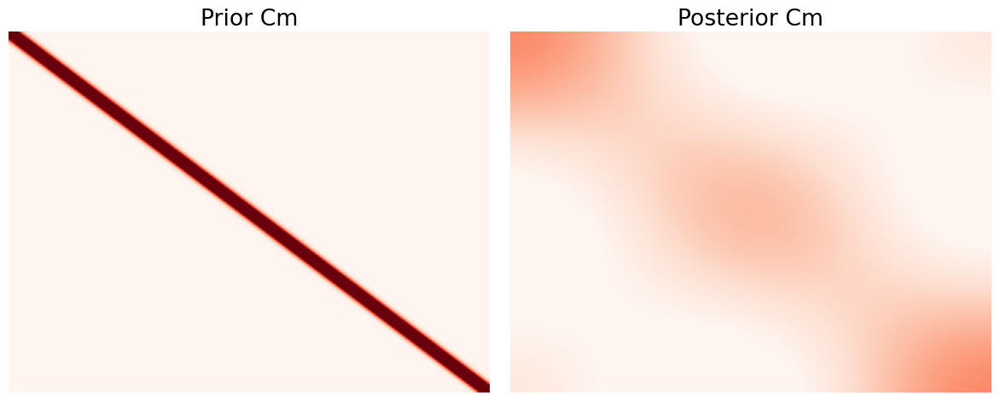

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(m0, 'b')
ax.fill_between(np.arange(nt0), m0 - np.sqrt(np.diag(Cm0)), 
                m0 + np.sqrt(np.diag(Cm0)), color='b', alpha=0.6)
ax.plot(mpost, 'r')
ax.fill_between(np.arange(nt0), mpost - np.sqrt(np.diag(Cmpost)), 
                m0 + np.sqrt(np.diag(Cmpost)), color='r', alpha=0.6)

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(np.diag(Cm0), 'b')
ax.plot(np.diag(Cmpost), 'r')

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(Cm0, cmap='Reds', vmin=0, vmax=.1)
axs[0].set_title('Prior Cm')
axs[0].axis('tight')
axs[0].axis('off')

axs[1].imshow(Cmpost, cmap='Reds', vmin=0, vmax=.1)
axs[1].set_title('Posterior Cm')
axs[1].axis('tight')
axs[1].axis('off')
fig.tight_layout()

### RTO

In [18]:
np.random.seed(10)

# RTO solution
nreals = 1000

mpostreals = []
for ireal in range(nreals):
    dreal = d + np.random.normal(0, 1, nt0)
    
    mreal =  m0 + Cm0 @ G.T @ (np.linalg.pinv(G @ Cm0 @ G.T + Cd, rcond=1e-20) @ (dreal - G @ m0))
    mpostreals.append(mreal)
    
mpostreals = np.vstack(mpostreals)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
Cmpostrto = ((mpostreals - mpostrto).T @ (mpostreals - mpostrto)) / (nreals - 1)

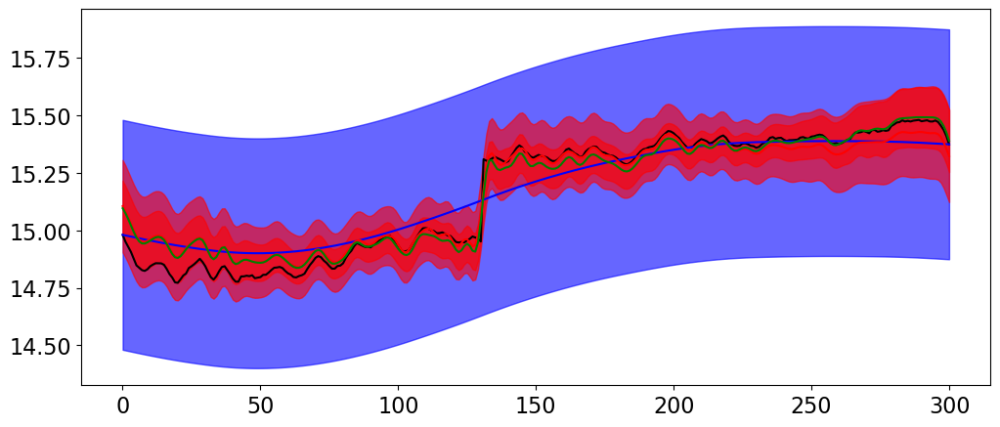

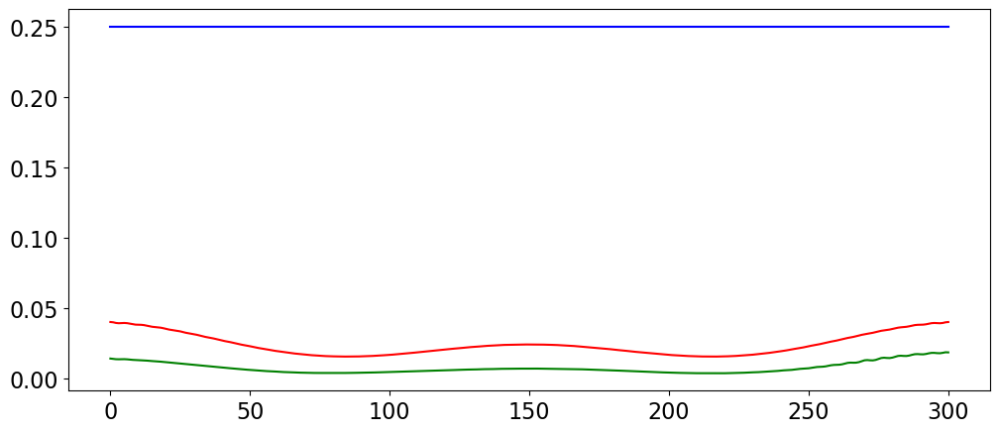

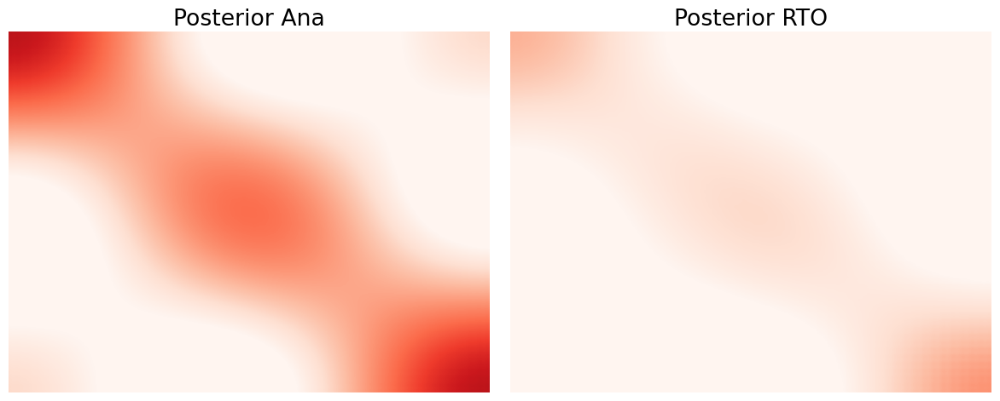

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(m, 'k')
ax.plot(m0, 'b')
ax.fill_between(np.arange(nt0), m0 - np.sqrt(np.diag(Cm0)), 
                m0 + np.sqrt(np.diag(Cm0)), color='b', alpha=0.6)
ax.plot(mpost, 'r')
ax.fill_between(np.arange(nt0), mpost - np.sqrt(np.diag(Cmpost)), 
                mpost + np.sqrt(np.diag(Cmpost)), color='r', alpha=0.6)
ax.plot(mpostrto, 'g')
ax.fill_between(np.arange(nt0), mpostrto - np.sqrt(np.diag(Cmpostrto)), 
                mpostrto + np.sqrt(np.diag(Cmpostrto)), color='r', alpha=0.6)

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.plot(np.diag(Cm0), 'b')
ax.plot(np.diag(Cmpost), 'r')
ax.plot(np.diag(Cmpostrto), 'g')

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(Cmpost, cmap='Reds', vmin=0, vmax=.05)
axs[0].set_title('Posterior Ana')
axs[0].axis('tight')
axs[0].axis('off')

axs[1].imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=.05)
axs[1].set_title('Posterior RTO')
axs[1].axis('tight')
axs[1].axis('off')

fig.tight_layout()

## 1D Seismic Inversion - pillar-by-pillar

In [20]:
# Model
inputfile='../data/avo/marmousi.npz'

model = np.load(inputfile)
x, z, m = model['x'][::5], model['z'][::5], np.log(model['model'])[::5, ::5]
nx, nz = len(x), len(z)
dx, dz = x[1]-x[0], z[1]-z[0]

z = np.arange(nz)
x = np.arange(nx)

In [21]:
# Wavelet
ntwav = 41

dt0 = 0.004
t0  = np.arange(nz)*dt0
wav = 1e2 * ricker(t0[:ntwav//2+1], 30)[0]

# Prior
nsmooth = 20
m0 = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, m, axis=0)
m0 = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, m0, axis=1)

In [22]:
# Prior m
corrrange = .008
sigma_m = .8

corr = np.exp(-3*(t0)**2/corrrange**2)
Corr = toeplitz(corr)
Std = np.diag(sigma_m * np.ones(Corr.shape[0]))
Cm0 = np.dot(Std, np.dot(Corr, Std))
Cm0_12 = cholesky(Cm0 + 1e-10*np.eye(nz), lower=True)

# Model
#ai = Cm0_12 @ np.random.normal(0, 1, nt0)
#aiback = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, ai)

# Operator and data noise
G = PoststackLinearModelling(wav, nt0=nz, explicit=True)
G = G.A
Cd = 1 * np.diag(np.random.random(nz).astype(np.float64))
Cd_12 = np.linalg.cholesky(Cd)

## 2D Seismic Inversion

We consider here a slightly different setting:

$$
\mathbf{d} = \mathbf{Gm} + \mathbf{n} \sim \mathcal{N}(\mathbf{Gm}, \mathbf{I}) \rightarrow p(\mathbf{d}|\mathbf{m}) \; \alpha \; e^{-\frac{1}{2}||\mathbf{d}-\mathbf{Gm}||_2^2}
$$

and

$$
\mathbf{m} = \mathbf{m}_0 + \mathbf{z} \sim \mathcal{N}(\mathbf{m}_0, \lambda_1^{-1}\mathbf{I}) \rightarrow p(\mathbf{m}) \; \alpha \; e^{-\frac{\lambda_1}{2}||\mathbf{m}-\mathbf{m_0}||_2^2}
$$

and

$$
\mathbf{Dm} = \mathbf{0} + \mathbf{z} \sim \mathcal{N}(\mathbf{m}_0, \lambda_2^{-1}\mathbf{I}) \rightarrow p(\mathbf{m}) \; \alpha \; e^{-\frac{\lambda_2}{2}||\mathbf{Dm}||_2^2}
$$


The negative log-posterior becomes:

$$
J = - log p(\mathbf{d}|\mathbf{m}) - logp_1(\mathbf{m}) - logp_2(\mathbf{m}) = \frac{1}{2} ||\mathbf{d}-\mathbf{Gm}||_2^2 + \frac{\lambda_1}{2} ||\mathbf{m}-\mathbf{m}_0||_2^2 + \frac{\lambda_2}{2} ||\mathbf{Dm}||_2^2
$$

which is equivalent to the system:

$$
\begin{bmatrix}
\mathbf{G} \\
\sqrt{\lambda_1}\mathbf{I} \\
\sqrt{\lambda_2}\mathbf{D} \\
\end{bmatrix} \mathbf{m} = 
\begin{bmatrix}
\mathbf{d} \\
\sqrt{\lambda_1}\mathbf{m}_0 \\
0
\end{bmatrix}
$$

whose analytical solution (the mean of the posterior distribution):

$$
\mathbf{m}_{post} = (\mathbf{G}^T \mathbf{G} + \lambda_1\mathbf{I} + \lambda_2\mathbf{D}^T\mathbf{D})^{-1} (\mathbf{G}^T\mathbf{d} + \lambda_1 \mathbf{m_0})
$$

In [23]:
# Model
inputfile='../data/avo/marmousi.npz'

model = np.load(inputfile)
mtrue = 1000 * model['model'][::5, ::5]
x, z, m = model['x'][::5], model['z'][::5], np.log(mtrue)
nx, nz = len(x), len(z)
dx, dz = x[1]-x[0], z[1]-z[0]

z = np.arange(nz)
x = np.arange(nx)

In [24]:
# Wavelet
ntwav = 41

t0  = np.arange(nz)*dt0
wav = 5e1 * ricker(t0[:ntwav//2+1], 30)[0]

# Prior
nsmooth = 20
m0 = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, m, axis=0)
m0 = filtfilt(np.ones(nsmooth)/float(nsmooth), 1, m0, axis=1)

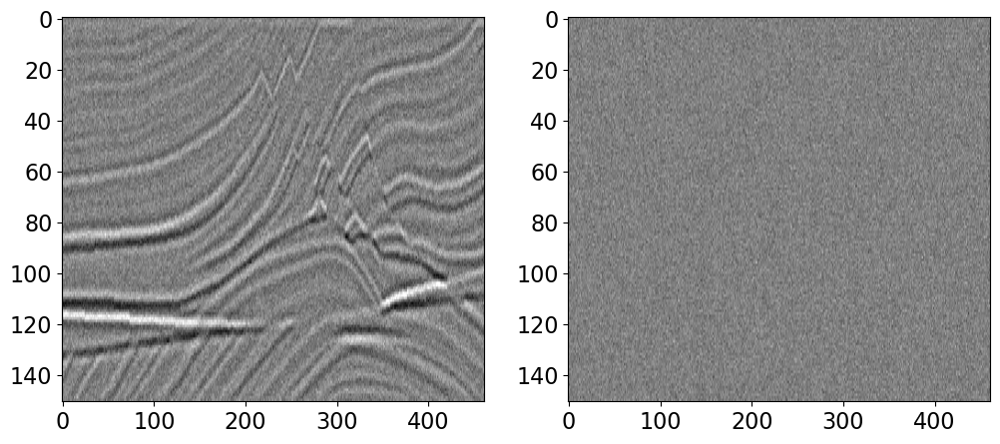

In [25]:
# Operator and data noise
G = PoststackLinearModelling(wav, nt0=nz, spatdims=nx, explicit=False)

# Data 
dtrue = G @ m 
d = dtrue + np.random.normal(0, 1, (nz, nx))

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(d, cmap='gray', vmin=-dtrue.max(), vmax=dtrue.max())
axs[0].axis('tight')
axs[1].imshow(dtrue-d, cmap='gray', vmin=-dtrue.max(), vmax=dtrue.max())
axs[1].axis('tight');

### Laplacian

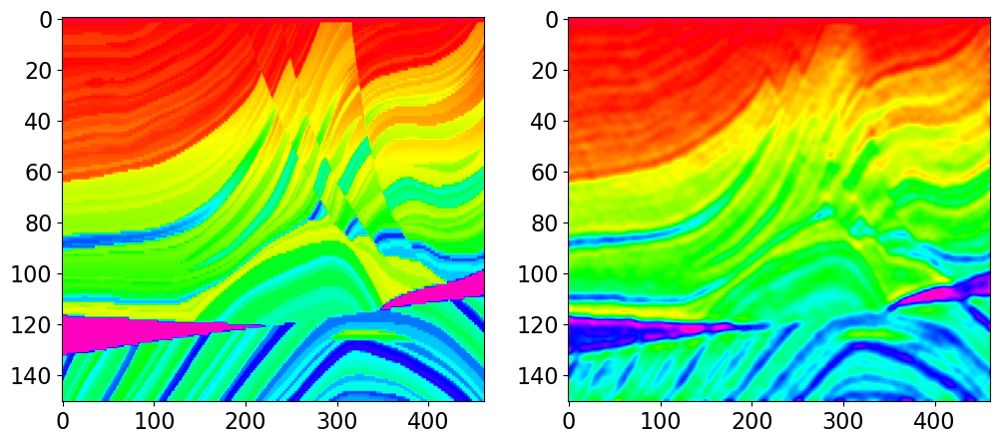

In [26]:
# MAP solution
Iop  = Identity(nz*nx, dtype='float64')
D2op  = Laplacian([nz, nx], weights=[1, 10], dtype='float64')

minv = normal_equations_inversion(G, d.flatten(), [D2op, Iop], x0=m0.ravel(), 
                                  dataregs=[np.zeros(nz*nx), m0.ravel()], epsRs=[np.sqrt(5e1), np.sqrt(1e-1)],
                                  **dict(maxiter=100))[0].reshape(nz, nx)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(mtrue, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(np.exp(minv), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[1].axis('tight');

In [27]:
np.random.seed(10)

# RTO solution
nreals = 100

mpostreals = []
for ireal in range(nreals):
    if ireal % 100 == 0:
        print(f'{ireal}/{nreals}')
    dreal = d.flatten() + np.random.normal(0, 1, nz*nx)
    
    mreal = normal_equations_inversion(G, dreal, [D2op, Iop], x0=minv.ravel(), 
                                       dataregs=[np.zeros(nz*nx), m0.ravel()], 
                                       epsRs=[np.sqrt(1e1), np.sqrt(1e-1)],
                                       **dict(maxiter=20))[0]
    mpostreals.append(np.exp(mreal))
    
mpostreals = np.vstack(mpostreals).reshape(nreals, nz, nx)
print(mpostreals.shape)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
varpostrto = np.var(mpostreals, axis=0)

0/100
(100, 151, 461)


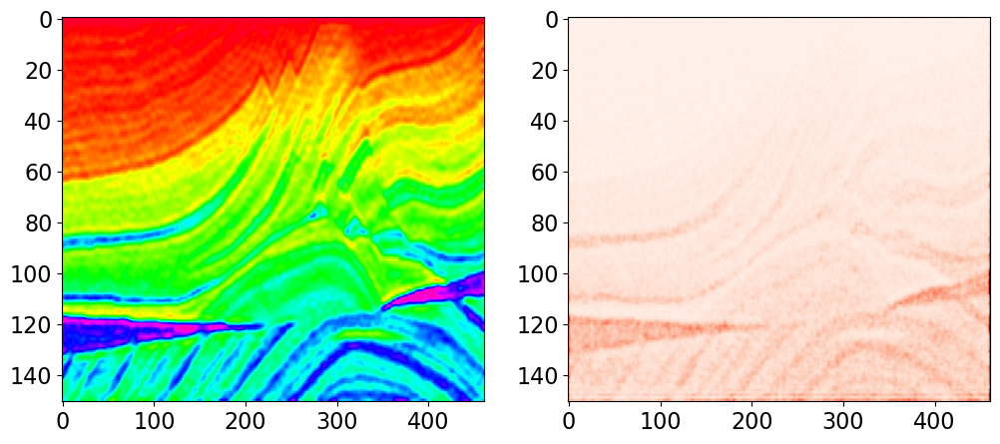

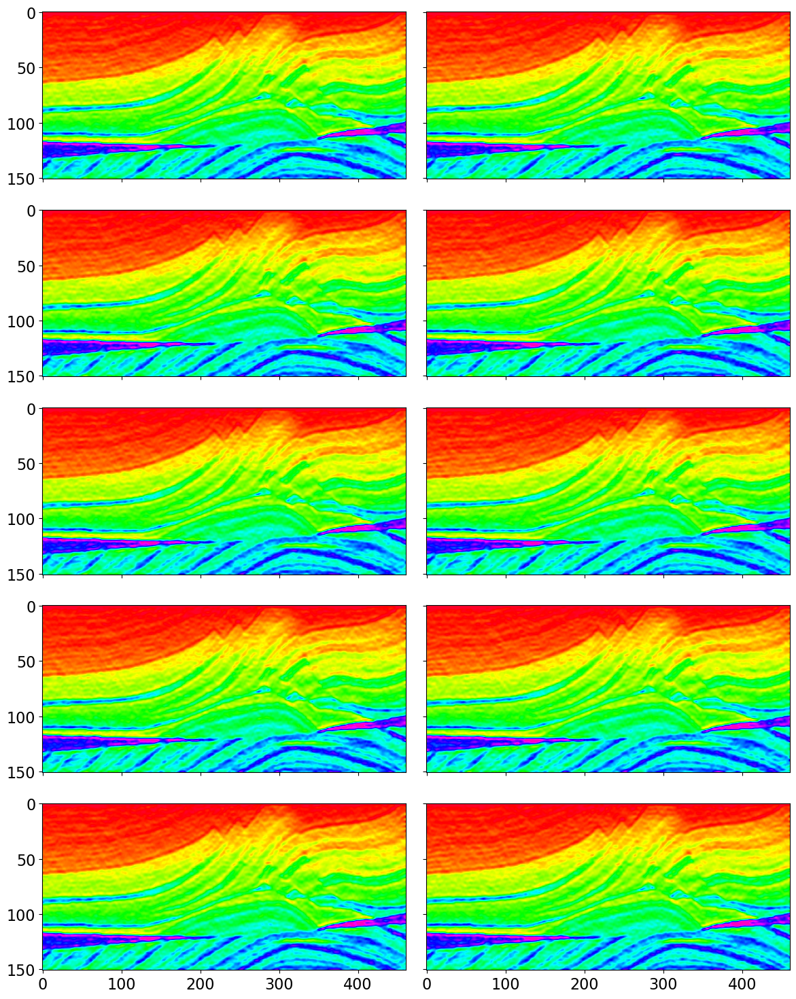

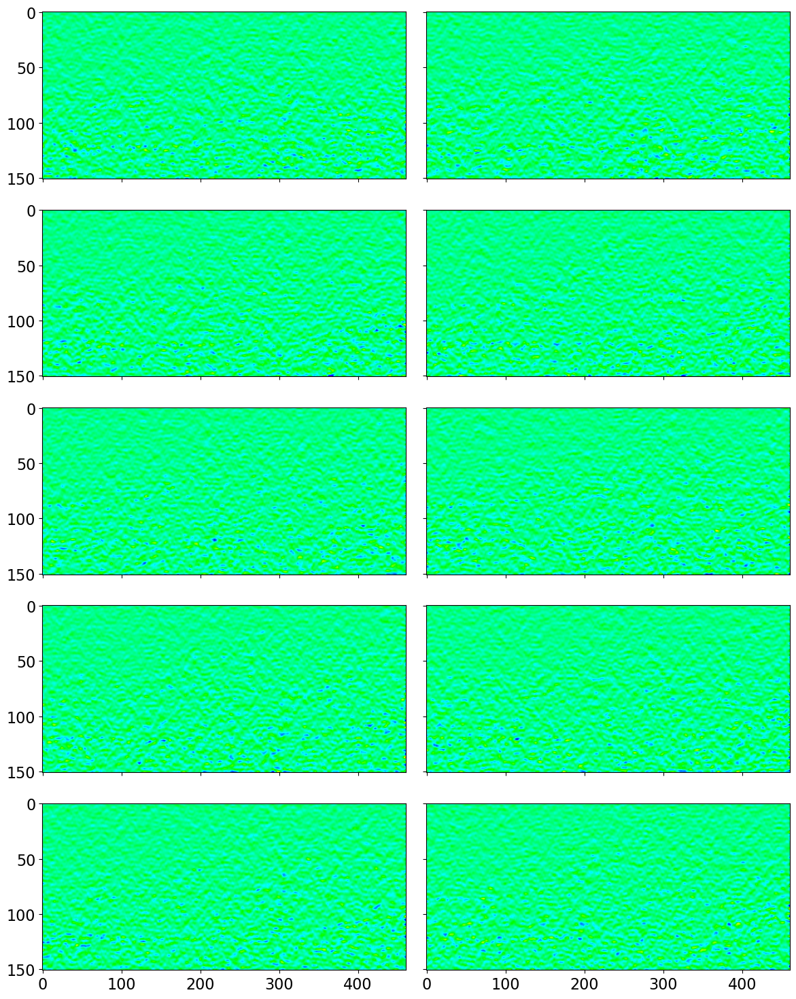

In [28]:
# Visualization
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(mpostrto, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(varpostrto, cmap='Reds', vmin=0, vmax=0.6*varpostrto.max())
axs[1].axis('tight')

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
    ax.axis('tight');
fig.tight_layout()

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostrto-mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=-0.1*mtrue.max(), vmax=0.1*mtrue.max())
    ax.axis('tight');
fig.tight_layout()

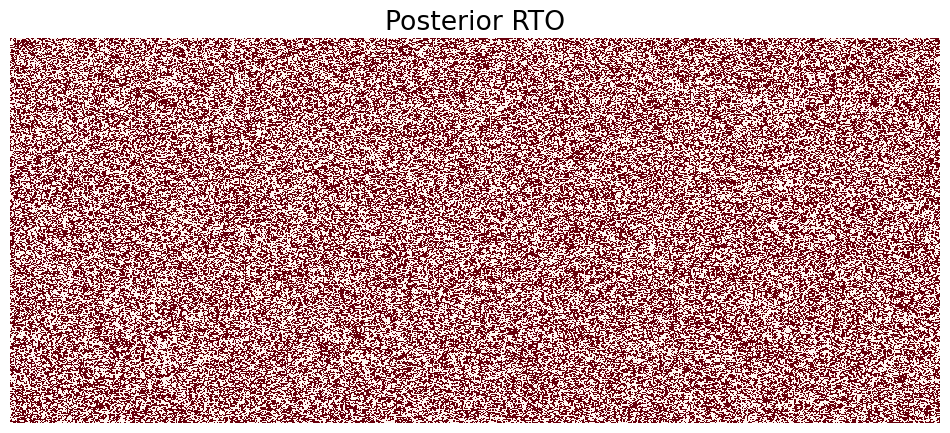

In [29]:
Cmpostrto = ((mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel()).T @ \
             (mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel())) / (nreals - 1);

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=1e-5)
ax.set_title('Posterior RTO')
ax.axis('tight')
ax.axis('off');

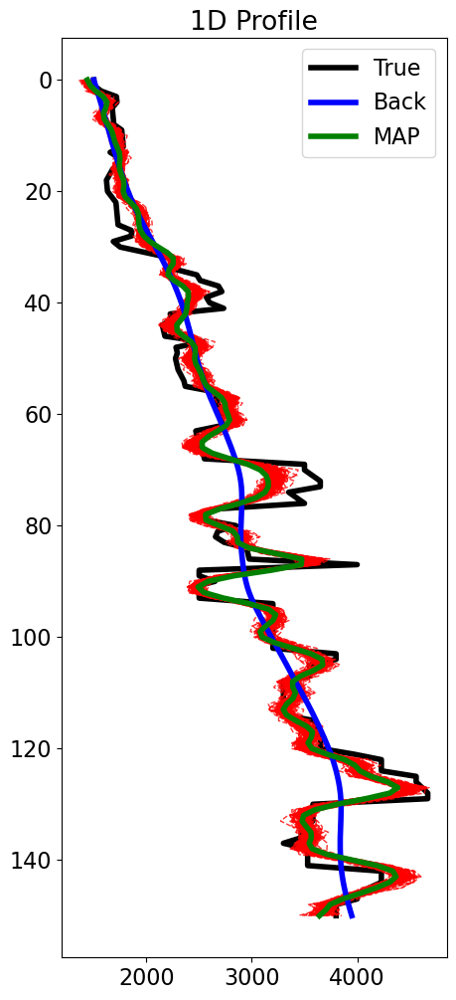

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(5, 12))
ax.plot(mtrue[:,nx//2], z, 'k', lw=4, label='True')
ax.plot(mpostreals.reshape(nreals, nz, nx)[:, :, nx//2].T, z, '--r', lw=1., alpha=0.8)
ax.plot(np.exp(m0)[:,nx//2], z, 'b', lw=4, label='Back')
ax.plot(np.exp(minv)[:,nx//2], z, 'g', lw=4, label='MAP')
ax.plot(mpostreals.reshape(nreals, nz, nx)[0, :, nx//2], z, '--r', lw=1., alpha=0.8, label='RTO')
ax.set_title('1D Profile')
ax.invert_yaxis()
ax.axis('tight')
ax.legend();

### Directional derivative

In [31]:
def slopeestimate(d, dz, dx, smooth=20, paralleldir=True):
    """Estimate local slopes and linearity using 
    Structure Tensor algorithm (Van Vliet and Verbeek, 1995)
    """
    gz, gx = np.gradient(d, dz, dx)
    gzz, gzx, gxx = gz*gz, gz*gx, gx*gx

    # smoothing
    gzz = gaussian_filter(gzz, sigma=smooth)
    gzx = gaussian_filter(gzx, sigma=smooth)
    gxx = gaussian_filter(gxx, sigma=smooth)

    dirs = np.zeros((2, nz, nx))
    slopes = np.zeros((nz, nx))
    linearity = np.zeros((nz, nx))
    for iz in range(nz):
        for ix in range(nx):
            T = np.array([[gzz[iz, ix], gzx[iz, ix]],
                          [gzx[iz, ix], gxx[iz, ix]]])
            E, U = np.linalg.eig(T)
            u = U[np.argmax(E)]
            v = U[np.argmin(E)]
            if paralleldir:
                dirs[:, iz, ix] = v
            else:
                dirs[:, iz, ix] = u
            slopes[iz, ix] = np.angle(v[1] + 1j*v[0])
            linearity[iz, ix] = (np.max(E) - np.min(E))/np.max(E) 
    dirs[1] *= -1
    return slopes, linearity, dirs, gz, gx, gzz, gzx, gxx

In [32]:
slopes, linearity, dirs_parallel, gz, gx, gzz, gzx, gxx = slopeestimate(d, dx, dz, smooth=7, paralleldir=True)

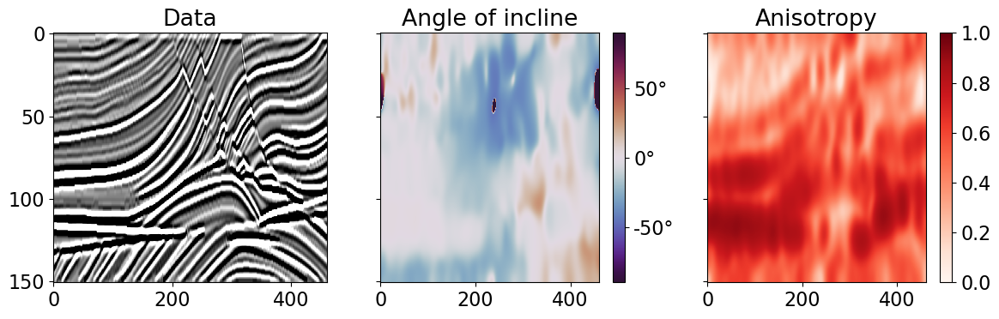

In [33]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
iax = axs[0].imshow(dtrue, cmap='gray', vmin=-1, vmax=1)
axs[0].set_title("Data")
axs[0].axis("tight")

iax = axs[1].imshow(-np.rad2deg(slopes), cmap="twilight_shifted", vmin=-90, vmax=90)
axs[1].set_title("Angle of incline")
axs[1].axis("tight")
fig.colorbar(iax, ax=axs[1], format=FuncFormatter(lambda x, pos: "{:.0f}°".format(x)))

iax = axs[2].imshow(linearity, cmap="Reds", vmin=0, vmax=1)
axs[2].set_title("Anisotropy")
axs[2].axis("tight")
fig.colorbar(iax, ax=axs[2])
fig.tight_layout();

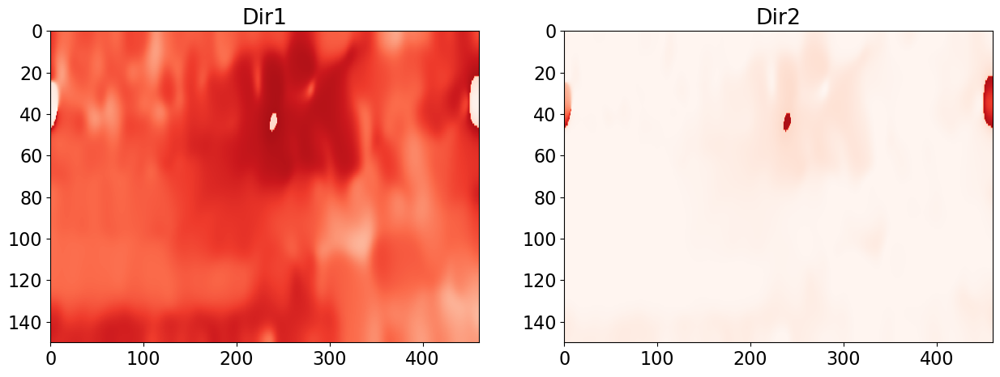

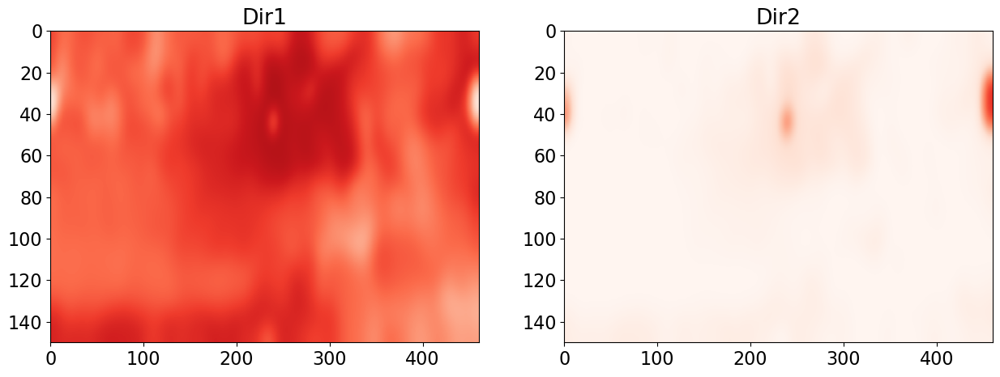

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(dirs_parallel[0], cmap='Reds', 
              extent = (x[0], x[-1], z[-1], z[0]), vmin=-1, vmax=1)
axs[0].set_title('Dir1')
axs[0].axis('tight')
axs[1].imshow(dirs_parallel[1], cmap='Reds', extent = (x[0], x[-1], z[-1], z[0]),
              vmin=-1, vmax=1)
axs[1].set_title('Dir2')
axs[1].axis('tight');

# Smooth parallel directions
dirs_parallel_smooth = np.concatenate((gaussian_filter(dirs_parallel[0], 5)[None, :], 
                                       gaussian_filter(dirs_parallel[1], 5)[None, :]), axis=0)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(dirs_parallel_smooth[0], cmap='Reds', 
              extent = (x[0], x[-1], z[-1], z[0]), vmin=-1, vmax=1)
axs[0].set_title('Dir1')
axs[0].axis('tight')
axs[1].imshow(dirs_parallel_smooth[1], cmap='Reds', extent = (x[0], x[-1], z[-1], z[0]),
              vmin=-1, vmax=1)
axs[1].set_title('Dir2')
axs[1].axis('tight');

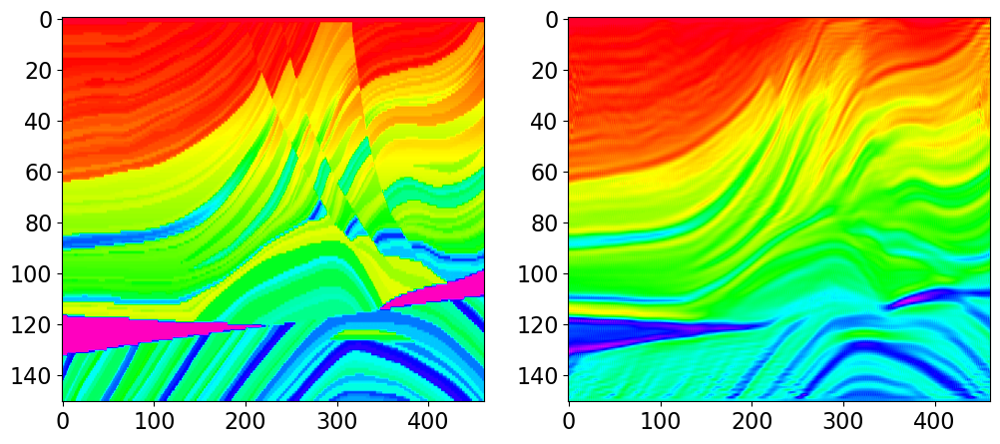

In [35]:
# MAP solution
Iop  = Identity(nz*nx, dtype='float64')
D2op = FirstDirectionalDerivative((nz, nx), v=dirs_parallel_smooth, dtype='float64')
Wop = Diagonal(linearity.ravel(), dtype='float64')

#I1op  = Identity(2*nz*nx, dtype='float64')
#Gop = Gradient((nz, nx))
#Eta = Diagonal(dirs_parallel.ravel())
#D2op = (I1op - Eta @ Eta.T) @ Gop 

minv = normal_equations_inversion(G, d.flatten(), [Wop @ D2op, Iop], x0=m0.ravel(),
                                  dataregs=[np.zeros(nz*nx), m0.ravel()],
                                  epsRs=[np.sqrt(1e5), np.sqrt(1e1)],
                                  #dataregs=[np.zeros(2*nz*nx), m0.ravel()],
                                  #epsRs=[np.sqrt(1e1), np.sqrt(1e1)],
                                  **dict(maxiter=500))[0].reshape(nz, nx)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(mtrue, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(np.exp(minv), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[1].axis('tight');

In [36]:
np.random.seed(10)

# RTO solution
nreals = 100

mpostreals = []
for ireal in range(nreals):
    if ireal % 10 == 0:
        print(f'{ireal}/{nreals}')
    dreal = d.flatten() + np.random.normal(0, 1, nz*nx)
    
    mreal = normal_equations_inversion(G, dreal, [D2op, Iop], x0=minv.ravel(), 
                                       dataregs=[np.zeros(nz*nx), m0.ravel()],
                                       epsRs=[np.sqrt(1e4), np.sqrt(1e1)],
                                       #dataregs=[np.zeros(2*nz*nx), m0.ravel()],
                                       #epsRs=[np.sqrt(1e1), np.sqrt(1e1)],
                                       **dict(maxiter=100))[0]
    mpostreals.append(np.exp(mreal))
    
mpostreals = np.vstack(mpostreals).reshape(nreals, nz, nx)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
varpostrto = np.var(mpostreals, axis=0)

0/100
10/100
20/100
30/100
40/100
50/100
60/100
70/100
80/100
90/100


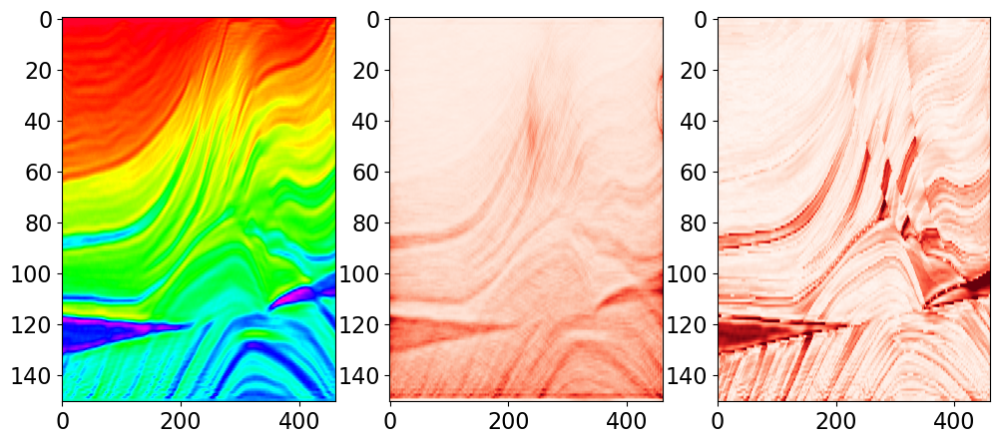

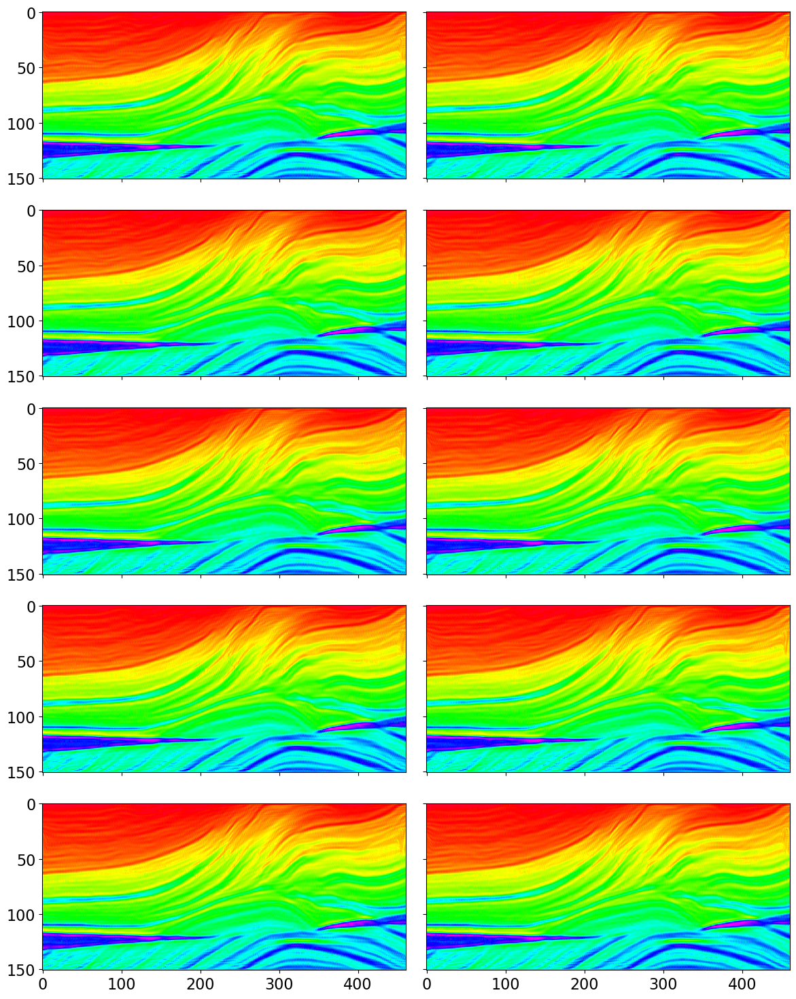

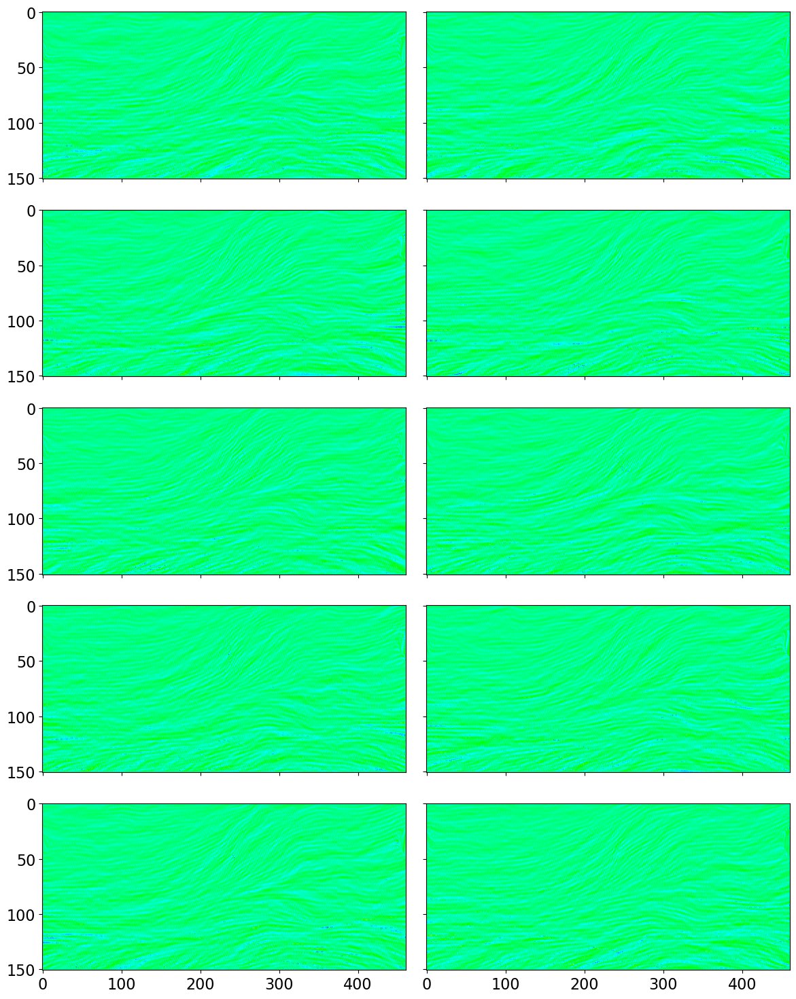

In [37]:
# Visualization
fig, axs = plt.subplots(1, 3, figsize=(12, 5))
axs[0].imshow(mpostrto, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(varpostrto, cmap='Reds', vmin=0, vmax=0.6*varpostrto.max())
axs[1].axis('tight')
axs[2].imshow(np.abs(mtrue-mpostrto), cmap='Reds', vmin=0, vmax=0.2*mpostrto.max())
axs[2].axis('tight')

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
    ax.axis('tight');
fig.tight_layout()

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostrto-mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=-0.1*mtrue.max(), vmax=0.1*mtrue.max())
    ax.axis('tight')
fig.tight_layout();

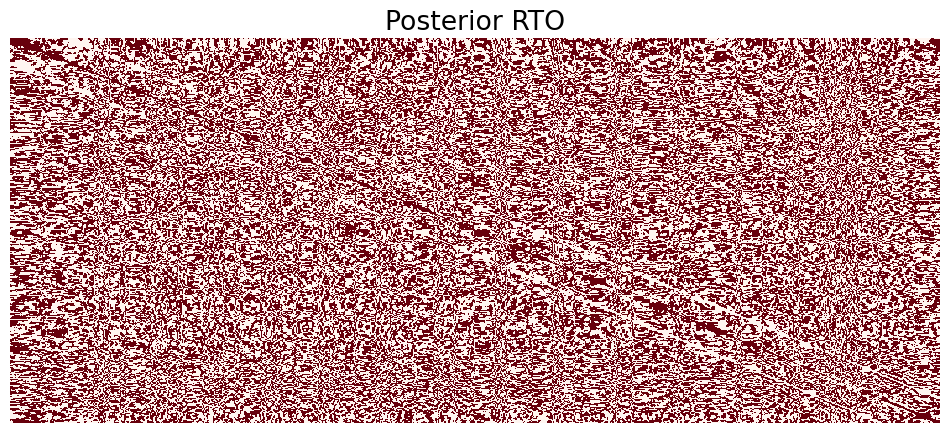

In [38]:
Cmpostrto = ((mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel()).T @ \
             (mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel())) / (nreals - 1);

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=1e-4)
ax.set_title('Posterior RTO')
ax.axis('tight')
ax.axis('off');

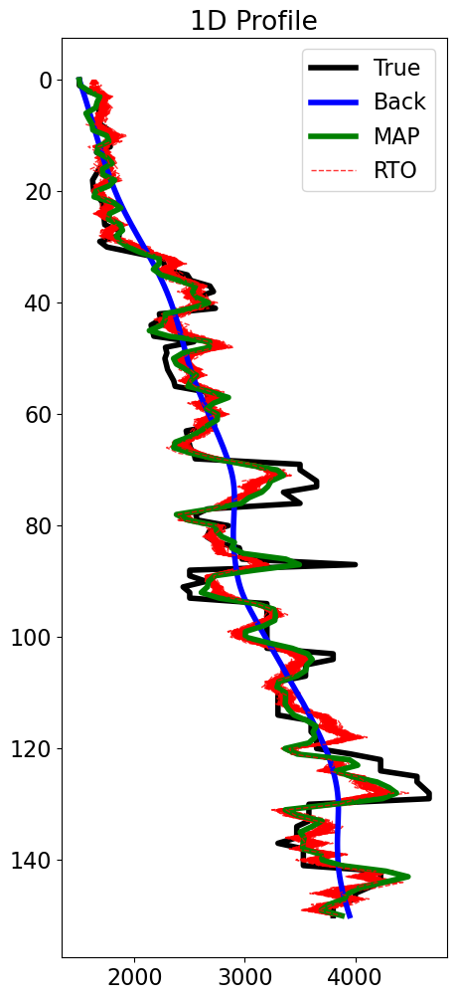

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(5, 12))
ax.plot(mtrue[:,nx//2], z, 'k', lw=4, label='True')
ax.plot(mpostreals.reshape(nreals, nz, nx)[:, :, nx//2].T, z, '--r', lw=1., alpha=0.8)
ax.plot(np.exp(m0)[:,nx//2], z, 'b', lw=4, label='Back')
ax.plot(np.exp(minv)[:,nx//2], z, 'g', lw=4, label='MAP')
ax.plot(mpostreals.reshape(nreals, nz, nx)[0, :, nx//2], z, '--r', lw=1., alpha=0.8, label='RTO')
ax.set_title('1D Profile')
ax.invert_yaxis()
ax.axis('tight')
ax.legend();

### Directional derivative with gradients

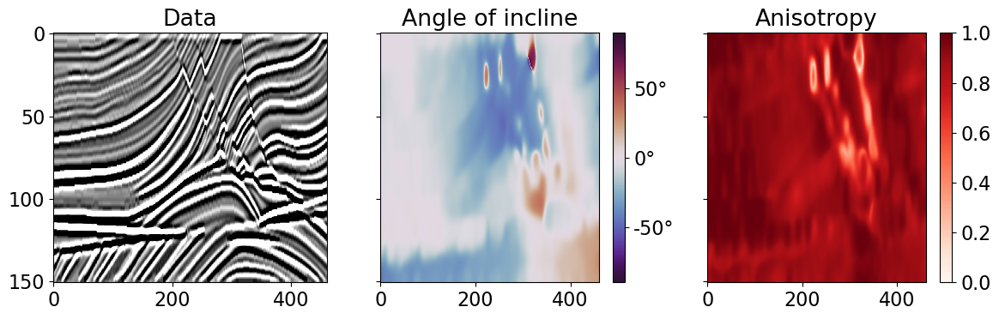

In [40]:
#angles, anisotropy = dip_estimate(d / d.max() - 0.5, smooth=9)
angles, anisotropy = dip_estimate(m / m.max() - 0.5, smooth=5)
angles = -angles
anglesdeg = np.rad2deg(angles)

fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
iax = axs[0].imshow(dtrue, cmap='gray', vmin=-1, vmax=1)
axs[0].set_title("Data")
axs[0].axis("tight")

iax = axs[1].imshow(anglesdeg, cmap="twilight_shifted", vmin=-90, vmax=90)
axs[1].set_title("Angle of incline")
axs[1].axis("tight")
fig.colorbar(iax, ax=axs[1], format=FuncFormatter(lambda x, pos: "{:.0f}°".format(x)))

iax = axs[2].imshow(anisotropy, cmap="Reds", vmin=0, vmax=1)
axs[2].set_title("Anisotropy")
axs[2].axis("tight")
fig.colorbar(iax, ax=axs[2])
fig.tight_layout();

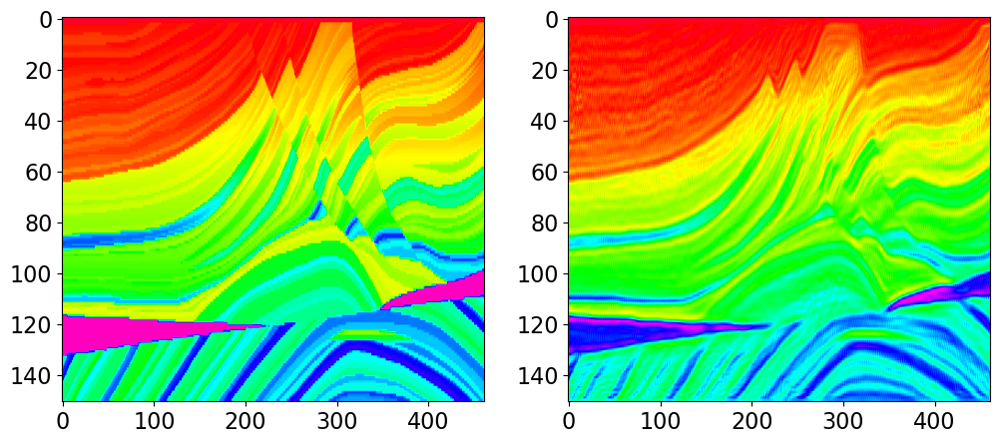

In [41]:
# MAP solution
Iop  = Identity(nz*nx, dtype='float64')
Gop = Gradient((nz, nx), dtype='float64')
Wop = Diagonal(linearity.ravel(), dtype='float64') @ HStack([Diagonal(np.sin(angles).ravel()),
                                                             Diagonal(np.cos(angles).ravel())])
D2op = Wop @ Gop

minv = normal_equations_inversion(G, d.flatten(), [D2op, Iop], x0=m0.ravel(),
                                  dataregs=[np.zeros(nz*nx), m0.ravel()],
                                  epsRs=[np.sqrt(1e4), np.sqrt(1e1)],
                                  #dataregs=[np.zeros(2*nz*nx), m0.ravel()],
                                  #epsRs=[np.sqrt(1e1), np.sqrt(1e1)],
                                  **dict(maxiter=500))[0].reshape(nz, nx)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].imshow(mtrue, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(np.exp(minv), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[1].axis('tight');

In [49]:
np.random.seed(10)

# RTO solution
nreals = 100

mpostreals = []
for ireal in range(nreals):
    if ireal % 10 == 0:
        print(f'{ireal}/{nreals}')
    dreal = d.flatten() + np.random.normal(0, 1, nz*nx)
    
    mreal = normal_equations_inversion(G, dreal, [D2op, Iop], x0=minv.ravel(), 
                                       dataregs=[np.zeros(nz*nx), m0.ravel()],
                                       epsRs=[np.sqrt(1e4), np.sqrt(1e1)],
                                       **dict(maxiter=100))[0]
    mpostreals.append(np.exp(mreal))
    
mpostreals = np.vstack(mpostreals).reshape(nreals, nz, nx)

# Bayesian analytical solution
mpostrto = np.mean(mpostreals, axis=0)
varpostrto = np.var(mpostreals, axis=0)

0/100
10/100
20/100
30/100
40/100
50/100
60/100
70/100
80/100
90/100


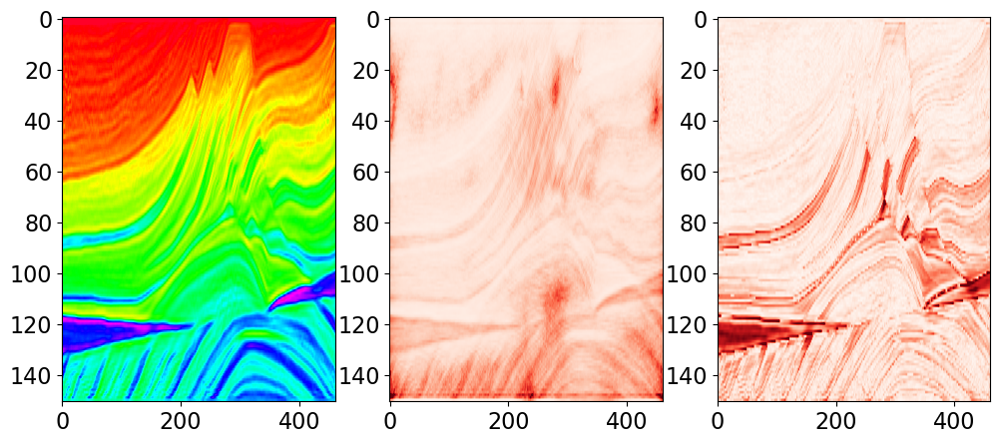

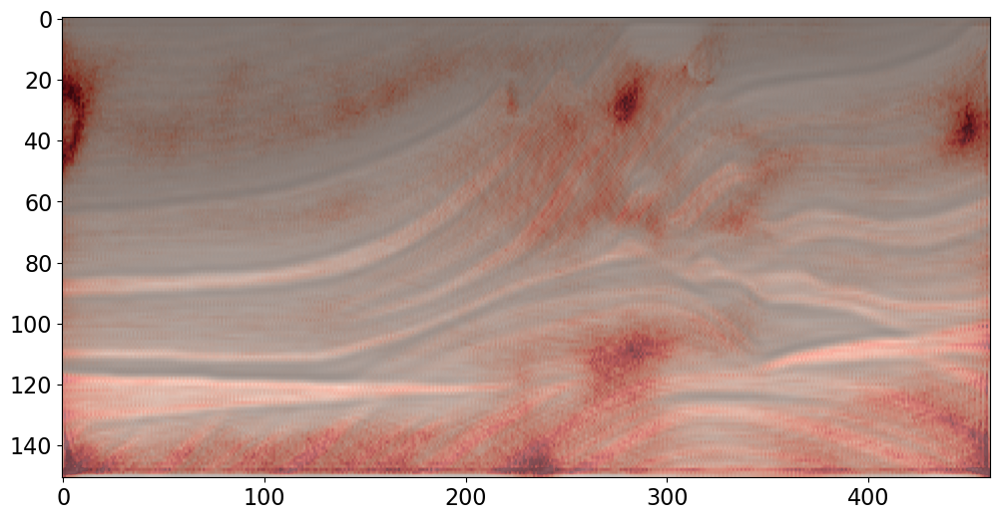

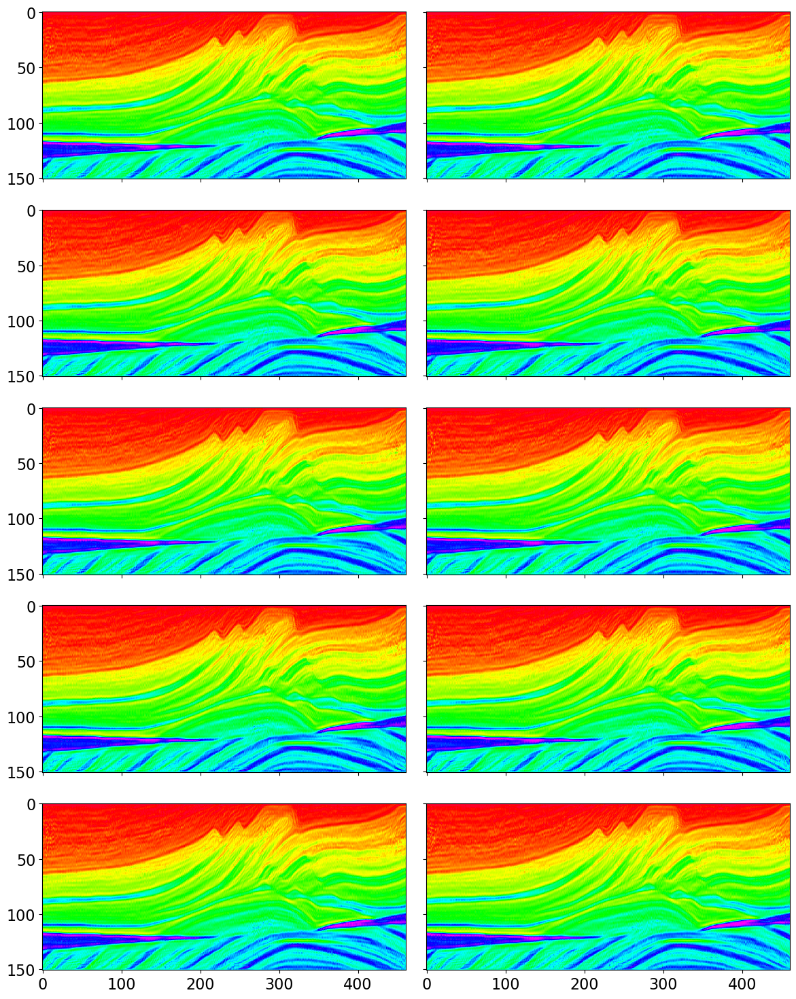

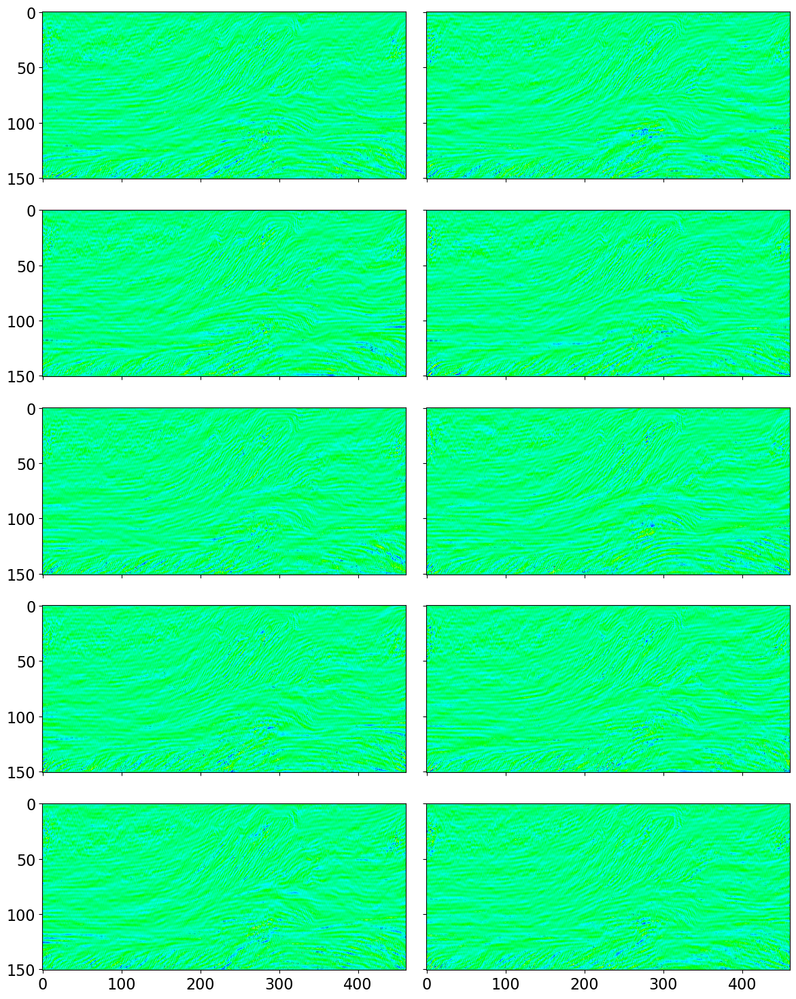

In [50]:
# Visualization
fig, axs = plt.subplots(1, 3, figsize=(12, 5))
axs[0].imshow(mpostrto, cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
axs[0].axis('tight')
axs[1].imshow(varpostrto, cmap='Reds', vmin=0, vmax=0.6*varpostrto.max())
axs[1].axis('tight')
axs[2].imshow(np.abs(mtrue-mpostrto), cmap='Reds', vmin=0, vmax=0.2*mpostrto.max())
axs[2].axis('tight')

fig, ax = plt.subplots(1, 1, sharey=True, figsize=(12, 6))
ax.imshow(mpostrto, cmap='gray', vmin=mtrue.min(), vmax=mtrue.max())
ax.imshow(varpostrto, cmap='Reds', vmin=0, vmax=0.4*varpostrto.max(), alpha=0.5)
ax.axis('tight')

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=mtrue.min(), vmax=mtrue.max())
    ax.axis('tight');
fig.tight_layout()

fig, axs = plt.subplots(5, 2, sharey=True, sharex=True, figsize=(12, 15))
for iax, ax in enumerate(axs.ravel()):
    ax.imshow(mpostrto-mpostreals[iax].reshape(nz, nx), cmap='gist_rainbow', vmin=-0.1*mtrue.max(), vmax=0.1*mtrue.max())
    ax.axis('tight')
fig.tight_layout();

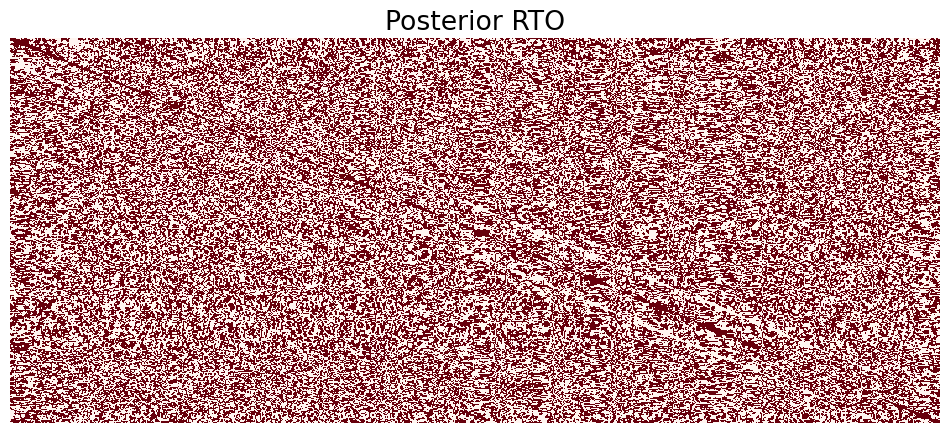

In [51]:
Cmpostrto = ((mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel()).T @ \
             (mpostreals[:, ::10, ::10].reshape(nreals, -1) - mpostrto[::10, ::10].ravel())) / (nreals - 1);

fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ax.imshow(Cmpostrto, cmap='Reds', vmin=0, vmax=1e-4)
ax.set_title('Posterior RTO')
ax.axis('tight')
ax.axis('off');

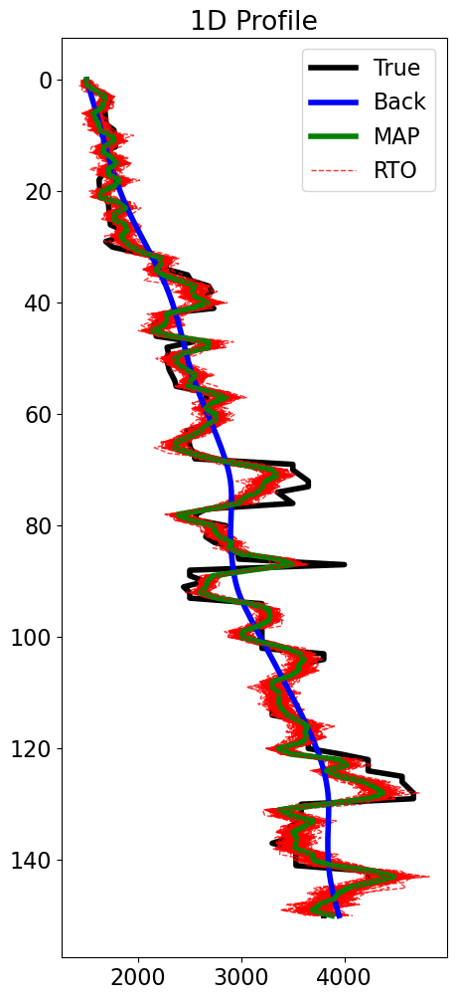

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(5, 12))
ax.plot(mtrue[:,nx//2], z, 'k', lw=4, label='True')
ax.plot(mpostreals.reshape(nreals, nz, nx)[:, :, nx//2].T, z, '--r', lw=1., alpha=0.8)
ax.plot(np.exp(m0)[:,nx//2], z, 'b', lw=4, label='Back')
ax.plot(np.exp(minv)[:,nx//2], z, 'g', lw=4, label='MAP')
ax.plot(mpostreals.reshape(nreals, nz, nx)[0, :, nx//2], z, '--r', lw=1., alpha=0.8, label='RTO')
ax.set_title('1D Profile')
ax.invert_yaxis()
ax.axis('tight')
ax.legend();